## Dataset Upload

In [ ]:
# Install the necessary library for Google Colab if not already installed
!pip install google-colab

# Import the file-upload utility from google.colab
from google.colab import files

# Upload dataset files into Colab
uploaded_files = files.upload()

# Print details about each uploaded file
for file_name in uploaded_files.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=file_name, length=len(uploaded_files[file_name])))

Saving Images.zip to Images (1).zip
User uploaded file "Images (1).zip" with length 53634348 bytes


## Import Data Visualisation & Machine Learning Packages

In [ ]:
# Data Visualisation Packages
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

from IPython.display import SVG
from PIL import Image

# Machine Learning Packages
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import Sequential
from tensorflow.keras.utils import model_to_dot

## Exploratory Data Analysis

In [ ]:
!unzip -o Images.zip

import os

# Define the main directory containing the dataset
dataset_directory = 'Images'

# Retrieve all subdirectories within the main dataset directory
category_folders = [folder for folder in os.listdir(dataset_directory) if os.path.isdir(os.path.join(dataset_directory, folder))]

# Iterate through each primary category folder
for category in category_folders:
    # Construct the full path to the category folder
    category_path = os.path.join(dataset_directory, category)

    # Display the category name
    print(f"Primary Category: {category}")

    # Retrieve all subdirectories within the category
    subcategory_folders = [folder for folder in os.listdir(category_path) if os.path.isdir(os.path.join(category_path, folder))]

    # Iterate through each subcategory folder
    for subcategory in subcategory_folders:
        # Construct the full path to the subcategory folder
        subcategory_path = os.path.join(category_path, subcategory)

        # Count the number of image files in the subcategory folder
        image_files = [file for file in os.listdir(subcategory_path) if os.path.isfile(os.path.join(subcategory_path, file))]
        print(f"  Subcategory: {subcategory}, Number of image files: {len(image_files)}")

Archive:  Images.zip
  inflating: Images/Test/Beer/Beer(Test) (1).jpg  
  inflating: Images/Test/Beer/Beer(Test) (10).jpg  
  inflating: Images/Test/Beer/Beer(Test) (2).jpg  
  inflating: Images/Test/Beer/Beer(Test) (3).jpg  
  inflating: Images/Test/Beer/Beer(Test) (4).jpg  
  inflating: Images/Test/Beer/Beer(Test) (5).jpg  
  inflating: Images/Test/Beer/Beer(Test) (6).jpg  
  inflating: Images/Test/Beer/Beer(Test) (7).jpg  
  inflating: Images/Test/Beer/Beer(Test) (8).jpg  
  inflating: Images/Test/Beer/Beer(Test) (9).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (1).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (10).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (2).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (3).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (4).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (5).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (6).jpg  
  inflating: Images/Test/Bibimbap/Bibimbap(Test) (7).j

## Training Images (Samples)

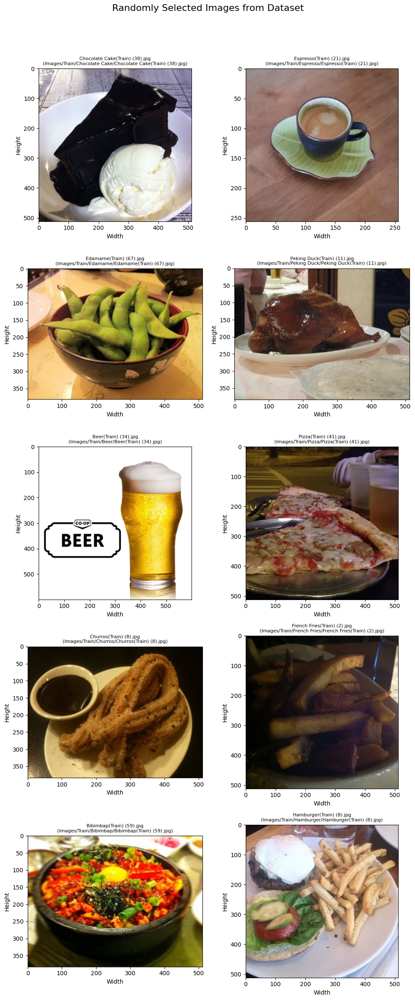

In [ ]:
import os
import random

def display_random_images_collage(base_directory):
    # Identify the deepest level subdirectories containing images
    leaf_subdirectories = []
    for root, directories, files in os.walk(dataset_directory):
        if not directories:  # If there are no further subdirectories, it's the deepest level
            leaf_subdirectories.append(root)

    # Collect a random image from each of the deepest subdirectories
    chosen_images = []
    for folder in random.sample(leaf_subdirectories, len(leaf_subdirectories)):
        image_files = [file for file in os.listdir(folder) if file.lower().endswith(('.jpg', '.png', '.jpeg'))]
        if image_files:
            selected_image_path = os.path.join(folder, random.choice(image_files))
            chosen_images.append(selected_image_path)

    # Determine the layout for displaying images
    num_images = len(chosen_images)
    columns = 2  # Number of columns in the grid
    rows = (num_images // columns) + (num_images % columns > 0)

    fig, axes = plt.subplots(rows, columns, figsize=(5 * columns, 5 * rows))
    fig.suptitle("Randomly Selected Images from Dataset", fontsize=16)

    # Ensure axes are iterable whether there's a single or multiple rows/columns
    if rows * columns > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    # Display images with titles
    for ax, image_path in zip(axes, chosen_images):
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis("on")  # Show axes for better visualization
        ax.set_xlabel("Width")
        ax.set_ylabel("Height")
        filename = os.path.basename(image_path)
        ax.set_title(f"{filename}\n({image_path})", fontsize=8)

    # Hide any unused subplots
    for i in range(num_images, len(axes)):
        axes[i].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

dataset_directory = "Images/Train"
display_random_images_collage(dataset_directory)


## Processing Dataset Images - Perform Data Augmentation

In [ ]:
# Create a directory to store augmented images
output_directory = "augmented_preview"
os.makedirs(output_directory, exist_ok=True)

# Configure augmentation settings for training images
augmentation_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8,1.2],
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Specify the image class, name, and path
image_category = 'Pizza'
image_filename = 'Pizza(Train) (50).jpg'
image_filepath = "Images/Train/Pizza/Pizza(Train) (50).jpg"


# Load and preprocess the image
original_image = load_img(image_filepath)
image_array = img_to_array(original_image)  # Convert to a NumPy array
image_array = image_array.reshape((1,) + image_array.shape)  # Reshape for augmentation

# Generate augmented images and save them to the specified directory
image_counter = 0
for augmented_batch in augmentation_generator.flow(
        image_array, batch_size=1,
        save_to_dir=output_directory,
        save_prefix=f"{image_category}_Augmented",
        save_format='jpeg'):

    image_counter += 1
    if image_counter > 80:
        break  # Stops after generating 80 augmented images


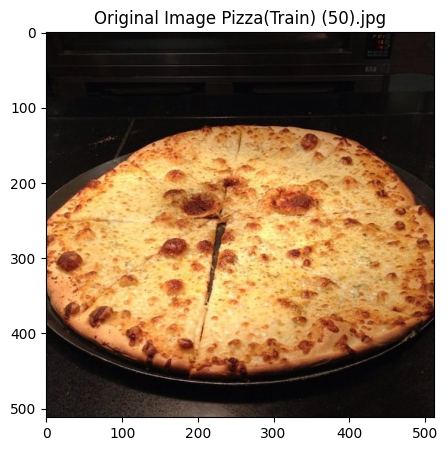

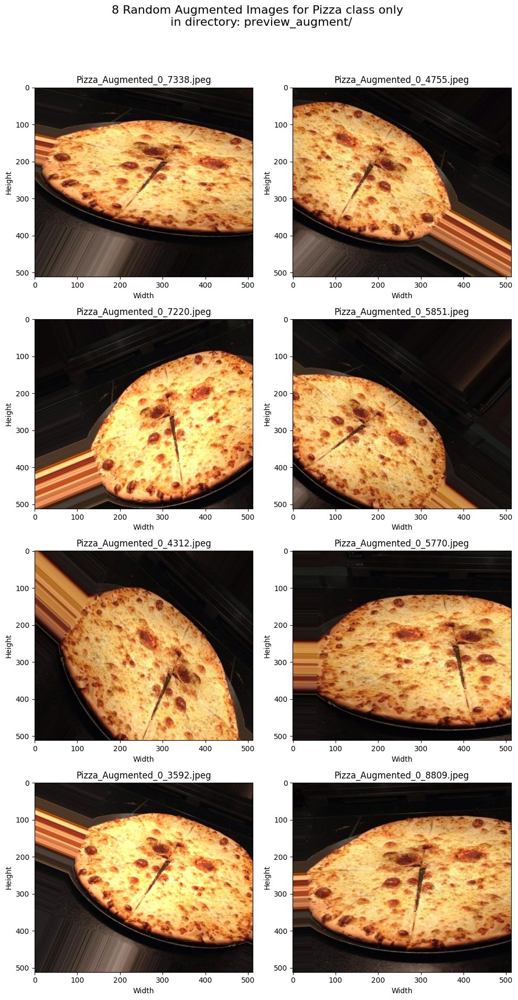

In [ ]:
# Load and display the original image
fig, ax = plt.subplots(figsize=(5, 5))
original_image = plt.imread(image_filepath)
ax.imshow(original_image, aspect='auto')  # Adjust aspect ratio
ax.set_title("Original Image " + image_filename)
plt.show()

# Retrieve all image filenames in the augmentation directory
augmented_files = os.listdir(output_directory)

# Select up to 8 random images from the augmented directory
num_images = min(8, len(augmented_files))
selected_images = random.sample(augmented_files, num_images) if num_images > 0 else []

# Determine subplot grid size
num_cols = 2 if num_images > 1 else 1
num_rows = (num_images // 2) + (num_images % 2)

# Create figure for displaying the augmented images
fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, num_rows * 5))
fig.suptitle(f'8 Random Augmented Images for {image_category} class only \n in directory: preview_augment/', fontsize=16)  # Title for the entire collage

# If only one image is selected
if len(selected_images) == 1:
    axs = [axs]

# Flatten the axs array for easier iteration
axs = axs.flatten()

for i, file in enumerate(selected_images):
    file_path = os.path.join(output_directory, file)
    img = plt.imread(file_path)
    axs[i].imshow(img, aspect='auto')  # Let each subplot adjust to its image's aspect ratio
    axs[i].set_title(file)

    # Adding axes labels
    axs[i].set_xlabel('Width')
    axs[i].set_ylabel('Height')

# Hide the empty subplots if any
for j in range(i + 1, len(axs)):
    axs[j].set_visible(False)  # This completely hides the subplot, including the frame

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title
plt.show()

## Normalise + Augment + Generator

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define constants
BATCH_SIZE = 32
IMAGE_SIZE = (150, 150)  # Resizing all images

# Data augmentation for training (includes transformations)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.8,1.2],
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Rescaling only for validation and test data (no augmentation)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Training data generator
train_generator = train_datagen.flow_from_directory(
    directory="Images/Train/",
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical"
)

# Validation data generator
validation_generator = validation_datagen.flow_from_directory(
    directory="Images/Validation/",
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

# Test data generator
test_generator = test_datagen.flow_from_directory(
    directory="Images/Test/",
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

Found 800 images belonging to 10 classes.
Found 105 images belonging to 10 classes.
Found 100 images belonging to 10 classes.


In [ ]:
# Retrieve and print class indices for each dataset
train_class_indices = train_generator.class_indices
valid_class_indices = validation_generator.class_indices
test_class_indices = test_generator.class_indices

# Display the assigned class labels
print("Class Indices:")
print(f"📌 Train Set: {train_class_indices}")
print(f"📌 Validation Set: {valid_class_indices}")
print(f"📌 Test Set: {test_class_indices}")

Class Indices:
📌 Train Set: {'Beer': 0, 'Bibimbap': 1, 'Chocolate Cake': 2, 'Churros': 3, 'Edamame': 4, 'Espresso': 5, 'French Fries': 6, 'Hamburger': 7, 'Peking Duck': 8, 'Pizza': 9}
📌 Validation Set: {'Beer': 0, 'Bibimbap': 1, 'Chocolate Cake': 2, 'Churros': 3, 'Edamame': 4, 'Espresso': 5, 'French Fries': 6, 'Hamburger': 7, 'Peking Duck': 8, 'Pizza': 9}
📌 Test Set: {'Beer': 0, 'Bibimbap': 1, 'Chocolate Cake': 2, 'Churros': 3, 'Edamame': 4, 'Espresso': 5, 'French Fries': 6, 'Hamburger': 7, 'Peking Duck': 8, 'Pizza': 9}


## CNN Model

In [ ]:
# Clear TensorFlow backend session to free up memory
tf.keras.backend.clear_session()

from tensorflow.keras.models import Sequential

# Defining Model Architecture
model_CNN = Sequential([

    # Input Layer + First Convolutional Layer
    Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3)),

    # Second Convolutional Layer + Batch Normalization + Pooling
    Conv2D(16, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),  # Normalizes activations, improving training stability
    MaxPooling2D(pool_size=(2, 2)),  # Reduces spatial dimensions

    Flatten(),  # Flattens feature maps into a single vector for classification

    # Fully Connected Layers (Dense Layers)
    Dense(128, activation="relu"),  # Hidden layer with ReLU activation
    Dropout(0.5),  # Reduces overfitting by randomly disabling neurons during training
    Dense(10, activation="softmax")  # Output layer with 10 classes (Softmax for probability distribution)
])

# Model Compilation
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)  # Adam optimizer with 0.0005 learning rate
model_CNN.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=['accuracy'])

# Display Model Summary
model_CNN.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 150, 150, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 150, 150, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 150, 150, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 75, 75, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 90000)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      11,520,128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,527,002 (43.97 MB)

 Trainable params: 11,526,970 (43.97 MB)

 Non-trainable params: 32 (128.00 B)

## Visualising the CNN Model

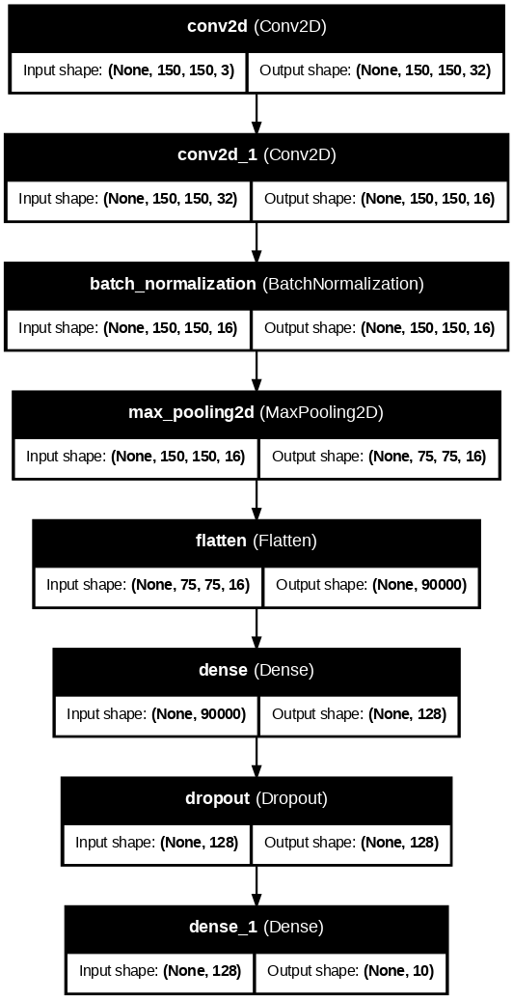

In [ ]:
from IPython.display import Image, display
import pydot
import io

# Generates a graphical representation of the model architecture
def visualize_model(model, dpi=80):

    # Create model visualization in PNG format
    graph = model_to_dot(model, show_shapes=True, dpi=dpi)
    png_data = graph.create(prog='dot', format='png')

    # Convert binary image data to a displayable format
    image_io = io.BytesIO(png_data)
    model_image = Image(image_io.read())

    # Display the model architecture image
    display(model_image)

# Call the function to visualize the CNN model
visualize_model(model_CNN)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


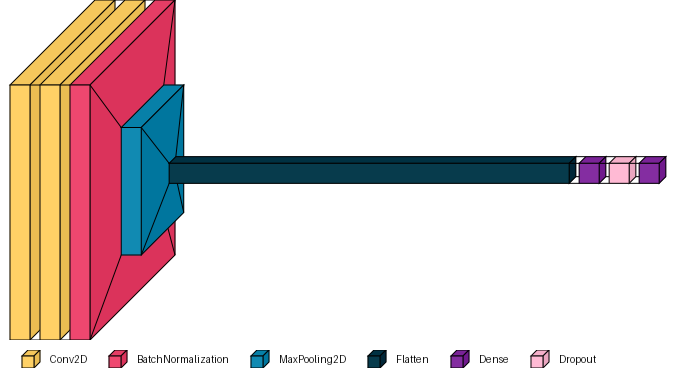

In [ ]:
# Install and Visualize Model Architecture using visualkeras
!pip install visualkeras
import visualkeras
visualkeras.layered_view(model_CNN, legend=True,scale_xy=1.70)

## Start of CNN Training
Using Google Colab T4 GPU

In [ ]:
# Early Stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor="val_loss",  # Watch validation loss
    patience=5,  # Stop training if no improvement after 15 epochs
    mode="min",  # Stops when validation loss stops decreasing
    verbose=1  # Print stop message when triggered
)

# Train the Model
history_CNN = model_CNN.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=60,  # Total training epochs
    callbacks=[early_stopping] # Using callbacks to prevent overfitting
)

Epoch 1/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 563ms/step - accuracy: 0.1885 - loss: 6.1686 - val_accuracy: 0.1238 - val_loss: 2.2339
Epoch 2/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 292ms/step - accuracy: 0.1859 - loss: 2.3296 - val_accuracy: 0.2762 - val_loss: 2.2734
Epoch 3/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 275ms/step - accuracy: 0.2458 - loss: 2.0822 - val_accuracy: 0.3238 - val_loss: 2.2226
Epoch 4/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 478ms/step - accuracy: 0.2819 - loss: 2.0613 - val_accuracy: 0.2095 - val_loss: 2.2829
Epoch 5/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 289ms/step - accuracy: 0.3255 - loss: 1.9780 - val_accuracy: 0.2857 - val_loss: 2.2603
Epoch 6/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 290ms/step - accuracy: 0.3276 - loss: 1.9455 - val_accuracy: 0.3143 - val_loss: 2.1529
Epoch 7/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - accuracy: 0.3407 - loss: 2.0052 - val_accuracy: 0.2476 - val_loss: 2.2226
Epoch 8/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 338ms/step - accuracy: 0.3070 - loss: 2.0601 - val_accuracy: 

## CNN Accuracy & Loss Graphs

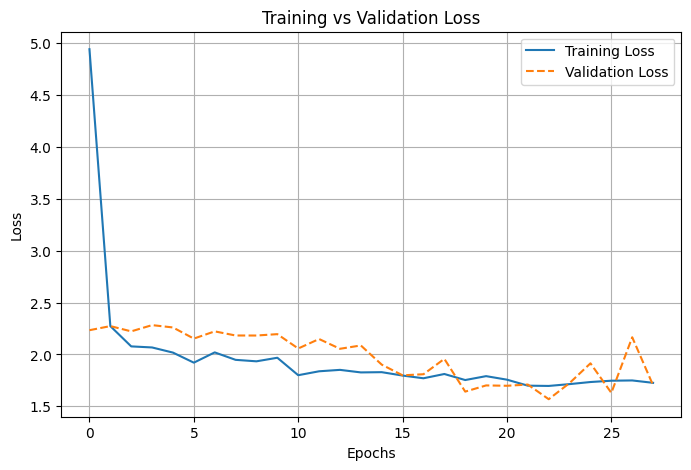

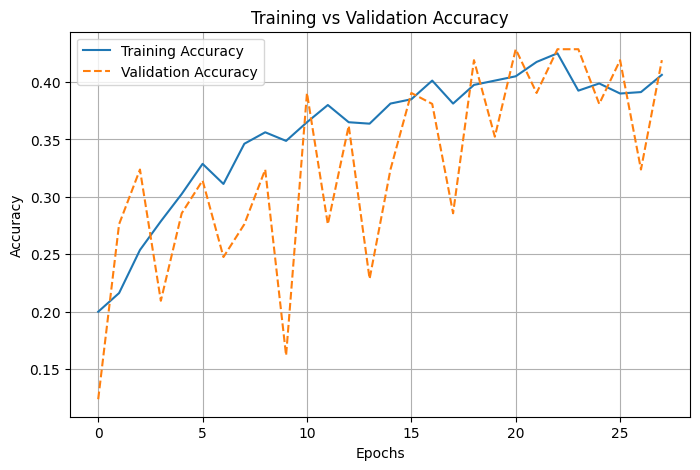

In [ ]:
def plot_training_curves(history):

    # Plot Training & Validation Loss
    plt.figure(figsize=(8, 5))
    plt.plot(history['loss'], label='Training Loss', linestyle='-')
    plt.plot(history['val_loss'], label='Validation Loss', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title("Training vs Validation Loss")
    plt.grid(True)

    # Plot Training & Validation Accuracy
    plt.figure(figsize=(8, 5))
    plt.plot(history['accuracy'], label='Training Accuracy', linestyle='-')
    plt.plot(history['val_accuracy'], label='Validation Accuracy', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title("Training vs Validation Accuracy")
    plt.grid(True)

    plt.show()

plot_training_curves(history_CNN.history)

## CNN Model Evaluation

In [ ]:
# Evaluate Model Performance on Training Data
train_loss, train_accuracy = model_CNN.evaluate(train_generator)
print(f"📌 CNN Training Loss    : {train_loss:.4f}")
print(f"📌 CNN Training Accuracy: {train_accuracy:.4f}\n")

# Evaluate Model Performance on Validation Data
val_loss, val_accuracy = model_CNN.evaluate(validation_generator)
print(f"📌 CNN Validation Loss    : {val_loss:.4f}")
print(f"📌 CNN Validation Accuracy: {val_accuracy:.4f}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 275ms/step - accuracy: 0.4003 - loss: 1.9825
📌 CNN Training Loss    : 1.9851
📌 CNN Training Accuracy: 0.3975

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5010 - loss: 1.5724
📌 CNN Validation Loss    : 1.7027
📌 CNN Validation Accuracy: 0.4190


## Testing on CNN Predictions

In [ ]:
# Loads images from a directory, preprocesses them, and generates predictions using the model
def predict_images(directory, model, image_size):

    test_images = []
    for image_name in os.listdir(directory):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(directory, image_name)
            img = load_img(path, target_size=image_size)
            img_array = img_to_array(img) * (1./255)  # Normalize pixel values
            img_array = np.expand_dims(img_array, axis=0) # Expand dimensions for batch processing
            prediction = model.predict(img_array)
            test_images.append((img, prediction, image_name, path))

    return test_images

In [ ]:
from matplotlib import colormaps

def create_subplots(test_images, title, figsize=(10, 5)):
    num_images = len(test_images)
    rows = num_images // 2 + (num_images % 2 > 0)
    fig, axes = plt.subplots(rows, 2, figsize=(figsize[0], figsize[1] * rows))
    fig.suptitle(title, fontsize=16)
    return fig, axes.flatten() if num_images > 1 else [axes]

# Plot Image Collage
def plot_image_collage(test_images, test_class, model_name):
    fig, axes = create_subplots(test_images, f"Image Collage for {test_class} ({model_name})")
    for ax, (img, prediction, image_name, file_path) in zip(axes, test_images):
        predicted_class = list(test_class_indices.keys())[np.argmax(prediction[0])]
        max_probability = np.around(np.max(prediction[0]), decimals=2) * 100
        ax.imshow(img)
        ax.set_title(f'Predicted: {predicted_class} ({max_probability:.2f}%)\n{image_name}\n{file_path}', fontsize=8)
        ax.axis('off')

    # Adjust title spacing
    fig.suptitle(f"Image Collage for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot Bar Graphs
def plot_prediction_bars(test_images, test_class, model_name):
    fig, axes = create_subplots(test_images, f"Prediction Probability Bar Graphs for {test_class} ({model_name})")
    for ax, (_, prediction, image_name, file_path) in zip(axes, test_images):
        classes = list(test_class_indices.keys())
        probabilities = np.around(prediction, decimals=2).flatten() * 100
        ax.bar(classes, probabilities)
        ax.set_xticklabels(classes, rotation=90, fontsize=8)
        ax.set_title(f'{image_name}\n{file_path}', fontsize=8)

    # Adjust title spacing
    fig.suptitle(f"Prediction Probability Bar Graphs for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot Pie Charts
def plot_prediction_piecharts(test_images, test_class, model_name, colormap_name='Dark2_r'):
    classes = list(test_class_indices.keys())
    colormap = colormaps[colormap_name]
    class_colors = {cls: colormap(i / len(classes)) for i, cls in enumerate(classes)}
    fig, axes = create_subplots(test_images, f"Prediction Probability Pie Charts for {test_class} ({model_name})")
    for ax, (_, prediction, image_name, file_path) in zip(axes, test_images):
        probabilities = np.around(prediction, decimals=2).flatten()
        probabilities /= np.sum(probabilities)
        significant_indices = probabilities > 0.01
        significant_probs = probabilities[significant_indices]
        significant_classes = np.array(classes)[significant_indices]
        colors = [class_colors[cls] for cls in significant_classes]
        ax.pie(significant_probs, colors=colors, autopct='%1.1f%%', startangle=140)
        ax.set_title(f'{image_name}\n{file_path}', fontsize=8)

    # Adjust title spacing
    fig.suptitle(f"Prediction Probability Pie Charts for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


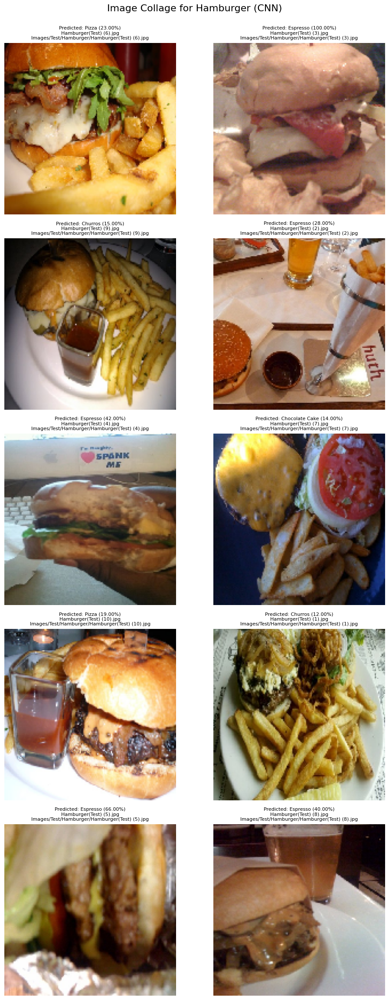

<ipython-input-26-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-26-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-26-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-26-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-26-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. aft

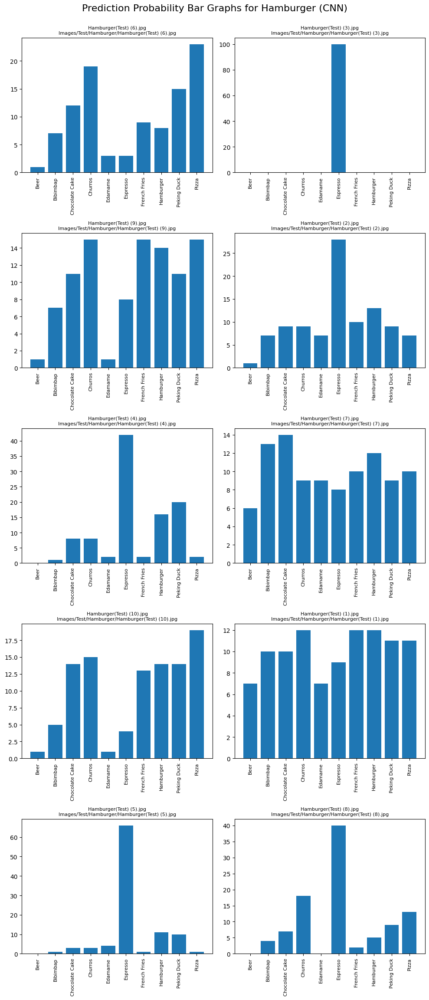

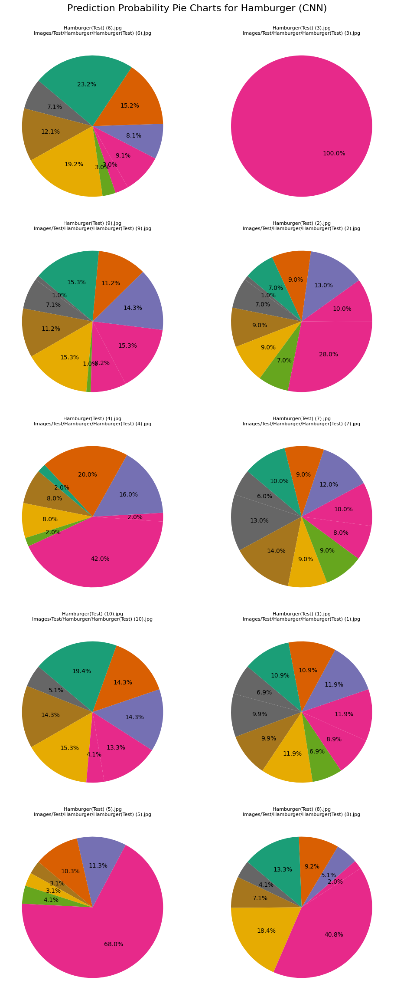

In [ ]:
model_name = "CNN"
test_class = "Hamburger"
test_images = predict_images('Images/Test/Hamburger', model_CNN,(150,150))
plot_image_collage(test_images, test_class, model_name)
plot_prediction_bars(test_images, test_class, model_name)
plot_prediction_piecharts(test_images, test_class, model_name)

## Pre-trained Model (VGG16)

In [ ]:
from tensorflow.keras.applications import VGG16

# Load Pretrained VGG16 Model without Top Layers
vgg16_base = VGG16(
  weights='imagenet',
  include_top=False, # The top layers are removed so we can add custom classification layers
  input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3)
)

print(vgg16_base.summary())

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 150, 150, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 150, 150, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 75, 75, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 75, 75, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 75, 75, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 37, 37, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 37, 37, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 18, 18, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 9, 9, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
# Clear TensorFlow backend session to free up memory
tf.keras.backend.clear_session()

# Freeze All Pretrained Layers to prevent re-training them
for layer in vgg16_base.layers:
    layer.trainable = False

# Construct Custom Model with VGG16 Base
# Adding fully connected layers on top of the pretrained base
model_vgg16 = Sequential([
    vgg16_base,  # Use the VGG16 base model for feature extraction
    tf.keras.layers.Flatten(),  # Convert feature maps into a single vector
    tf.keras.layers.Dense(512, activation='relu'),  # Fully connected layer with ReLU activation
    tf.keras.layers.Dropout(0.5),  # Dropout layer to prevent overfitting
    tf.keras.layers.Dense(256, activation='relu'),  # Another fully connected layer
    tf.keras.layers.Dense(10, activation='softmax')  # Output layer with softmax activation for 10 classes
])

# Compile the Model with categorical crossentropy loss and Adam optimizer
model_vgg16.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

# Display Model Summary
model_vgg16.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,194,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,043,402 (72.64 MB)

 Trainable params: 4,328,714 (16.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

## VGG16 Model Visualisation

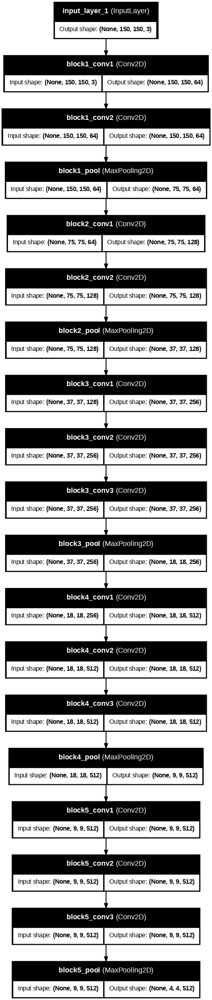

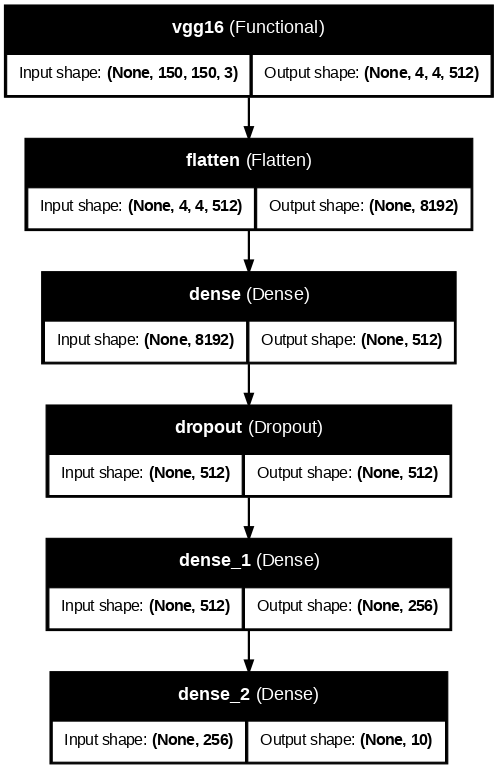

In [ ]:
# Generate Model Graphs for visualization
from IPython.display import Image, display
import pydot
import io

# Generates a graphical representation of the model architecture
def visualize_model_graph(model):
    graph = model_to_dot(model, show_shapes=True, dpi=80)
    png_data = graph.create(prog='dot', format='png')
    image_io = io.BytesIO(png_data)
    image = Image(image_io.read())
    display(image)

# Visualize both the base VGG16 model and the custom model
visualize_model_graph(vgg16_base)
visualize_model_graph(model_vgg16)

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


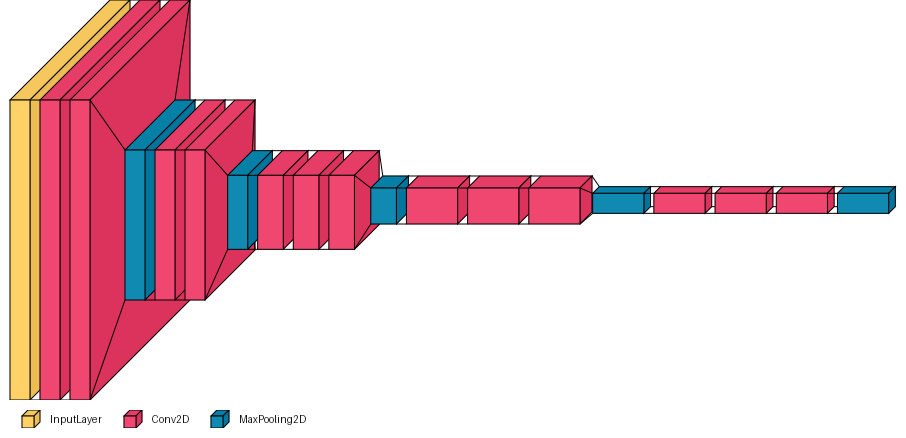

In [ ]:
# Install and Visualize Model Architecture using visualkeras
!pip install visualkeras
import visualkeras

visualkeras.layered_view(vgg16_base, legend=True, scale_xy=2)

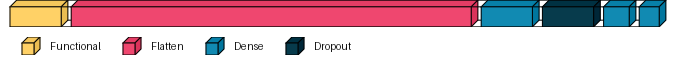

In [ ]:
visualkeras.layered_view(model_vgg16, legend=True, scale_xy=2)

## Start of VGG16 Training
Using Google Colab T4 GPU

In [ ]:
# Early Stopping to prevent overfitting
early_stopping = EarlyStopping(
  monitor='val_loss', # Watch validation loss
  patience=15, # Stop training if no improvement after 15 epochs
  mode='min', # Stops when validation loss stops decreasing
  verbose=1 # Print stop message when triggered
)

# Train the Model
history_vgg16 = model_vgg16.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=60, #Total training epochs
    callbacks=[early_stopping] # Using callbacks to prevent overfitting
)

Epoch 1/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 31s 667ms/step - accuracy: 0.2369 - loss: 2.6397 - val_accuracy: 0.5048 - val_loss: 1.4068
Epoch 2/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 290ms/step - accuracy: 0.4429 - loss: 1.5862 - val_accuracy: 0.6381 - val_loss: 1.1147
Epoch 3/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 318ms/step - accuracy: 0.5365 - loss: 1.3765 - val_accuracy: 0.5714 - val_loss: 1.1802
Epoch 4/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 297ms/step - accuracy: 0.5567 - loss: 1.2756 - val_accuracy: 0.6381 - val_loss: 1.0556
Epoch 5/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.6152 - loss: 1.1422 - val_accuracy: 0.6476 - val_loss: 0.9769
Epoch 6/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 316ms/step - accuracy: 0.6320 - loss: 1.1026 - val_accuracy: 0.6952 - val_loss: 0.8890
Epoch 7/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 338ms/step - accuracy: 0.6138 - loss: 1.0849 - val_accuracy: 0.6857 - val_loss: 0.9212
Epoch 8/60
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 287ms/step - accuracy: 0.6376 - loss: 1.0170 - val_accuracy: 0

## VGG16 Accuracy & Loss Graphs

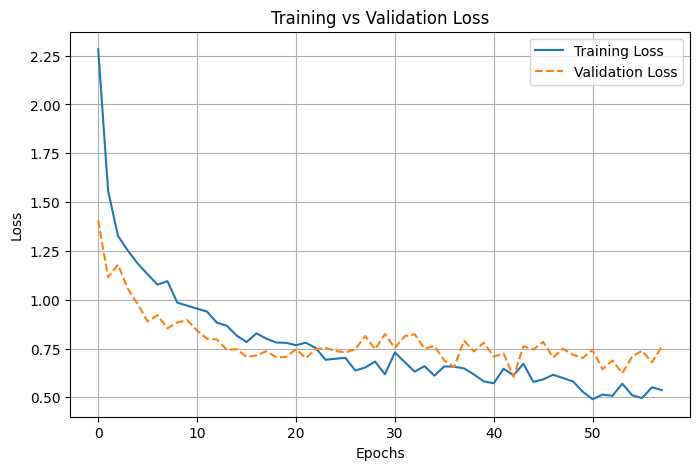

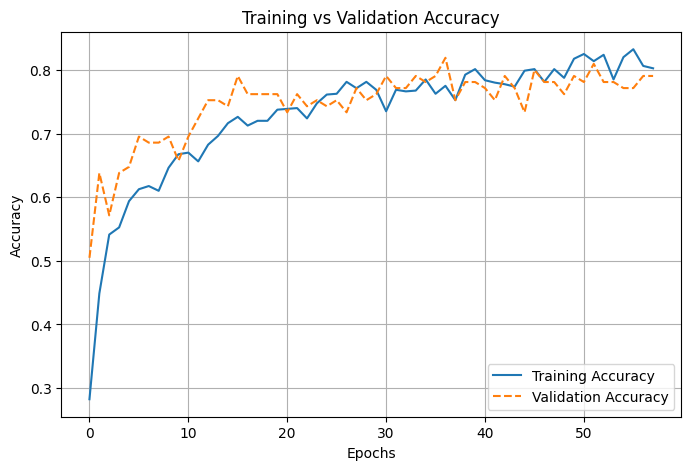

In [ ]:
def plot_training_curves(history):

  # Plot Training & Validation Loss
  plt.figure(figsize=(8, 5))
  plt.plot(history['loss'], label='Training Loss', linestyle='-')
  plt.plot(history['val_loss'], label='Validation Loss', linestyle='--')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.title("Training vs Validation Loss")
  plt.grid(True)

  # Plot Training & Validation Accuracy
  plt.figure(figsize=(8, 5))
  plt.plot(history['accuracy'], label='Training Accuracy', linestyle='-')
  plt.plot(history['val_accuracy'], label='Validation Accuracy', linestyle='--')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.title("Training vs Validation Accuracy")
  plt.grid(True)

  plt.show()

plot_training_curves(history_vgg16.history)

## VGG16 Model Evaluation

In [ ]:
# Evaluate Model Performance on Training Data
train_loss, train_accuracy = model_vgg16.evaluate(train_generator)
print(f"📌 VGG16 Training Loss    : {train_loss:.4f}")
print(f"📌 VGG16 Training Accuracy: {train_accuracy:.4f}\n")

# Evaluate Model Performance on Validation Data
val_loss, val_accuracy = model_vgg16.evaluate(validation_generator)
print(f"📌 VGG16 Validation Loss    : {val_loss:.4f}")
print(f"📌 VGG16 Validation Accuracy: {val_accuracy:.4f}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 464ms/step - accuracy: 0.9328 - loss: 0.2576
📌 VGG16 Training Loss    : 0.2772
📌 VGG16 Training Accuracy: 0.9212

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8287 - loss: 0.6488 
📌 VGG16 Validation Loss    : 0.7605
📌 VGG16 Validation Accuracy: 0.7905


## Testing on VGG16 Predictions

In [ ]:
# Loads images from a directory, preprocesses them, and generates predictions using the model
def predict_images(directory, model, image_size):

    test_images = []
    for image_name in os.listdir(directory):
        if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(directory, image_name)
            img = load_img(path, target_size=image_size)
            img_array = img_to_array(img) * (1./255)  # Normalize pixel values
            img_array = np.expand_dims(img_array, axis=0) # Expand dimensions for batch processing
            prediction = model.predict(img_array)
            test_images.append((img, prediction, image_name, path))

    return test_images

In [ ]:
from matplotlib import colormaps

def create_subplots(test_images, title, figsize=(10, 5)):
    num_images = len(test_images)
    rows = num_images // 2 + (num_images % 2 > 0)
    fig, axes = plt.subplots(rows, 2, figsize=(figsize[0], figsize[1] * rows))
    fig.suptitle(title, fontsize=16)
    return fig, axes.flatten() if num_images > 1 else [axes]

# Plot Image Collage
def plot_image_collage(test_images, test_class, model_name):
    fig, axes = create_subplots(test_images, f"Image Collage for {test_class} ({model_name})")
    for ax, (img, prediction, image_name, file_path) in zip(axes, test_images):
        predicted_class = list(test_class_indices.keys())[np.argmax(prediction[0])]
        max_probability = np.around(np.max(prediction[0]), decimals=2) * 100
        ax.imshow(img)
        ax.set_title(f'Predicted: {predicted_class} ({max_probability:.2f}%)\n{image_name}\n{file_path}', fontsize=8)
        ax.axis('off')

    # Adjust title spacing
    fig.suptitle(f"Image Collage for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot Bar Graphs
def plot_prediction_bars(test_images, test_class, model_name):
    fig, axes = create_subplots(test_images, f"Prediction Probability Bar Graphs for {test_class} ({model_name})")
    for ax, (_, prediction, image_name, file_path) in zip(axes, test_images):
        classes = list(test_class_indices.keys())
        probabilities = np.around(prediction, decimals=2).flatten() * 100
        ax.bar(classes, probabilities)
        ax.set_xticklabels(classes, rotation=90, fontsize=8)
        ax.set_title(f'{image_name}\n{file_path}', fontsize=8)

    # Adjust title spacing
    fig.suptitle(f"Prediction Probability Bar Graphs for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot Pie Charts
def plot_prediction_piecharts(test_images, test_class, model_name, colormap_name='Dark2_r'):
    classes = list(test_class_indices.keys())
    colormap = colormaps[colormap_name]
    class_colors = {cls: colormap(i / len(classes)) for i, cls in enumerate(classes)}
    fig, axes = create_subplots(test_images, f"Prediction Probability Pie Charts for {test_class} ({model_name})")
    for ax, (_, prediction, image_name, file_path) in zip(axes, test_images):
        probabilities = np.around(prediction, decimals=2).flatten()
        probabilities /= np.sum(probabilities)
        significant_indices = probabilities > 0.01
        significant_probs = probabilities[significant_indices]
        significant_classes = np.array(classes)[significant_indices]
        colors = [class_colors[cls] for cls in significant_classes]
        ax.pie(significant_probs, colors=colors, autopct='%1.1f%%', startangle=140)
        ax.set_title(f'{image_name}\n{file_path}', fontsize=8)

    # Adjust title spacing
    fig.suptitle(f"Prediction Probability Pie Charts for {test_class} ({model_name})", fontsize=16, y=0.95)

    # Remove empty subplots
    for i in range(len(test_images), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


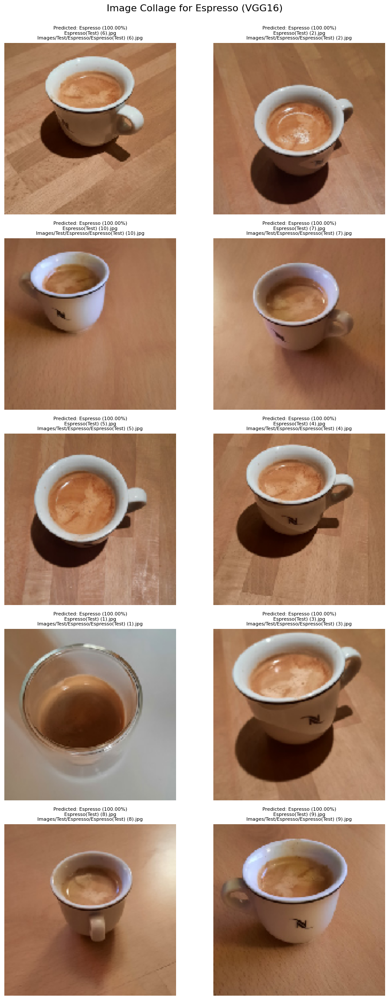

<ipython-input-37-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-37-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-37-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-37-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(classes, rotation=90, fontsize=8)
<ipython-input-37-399e9c5c9ee1>:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. aft

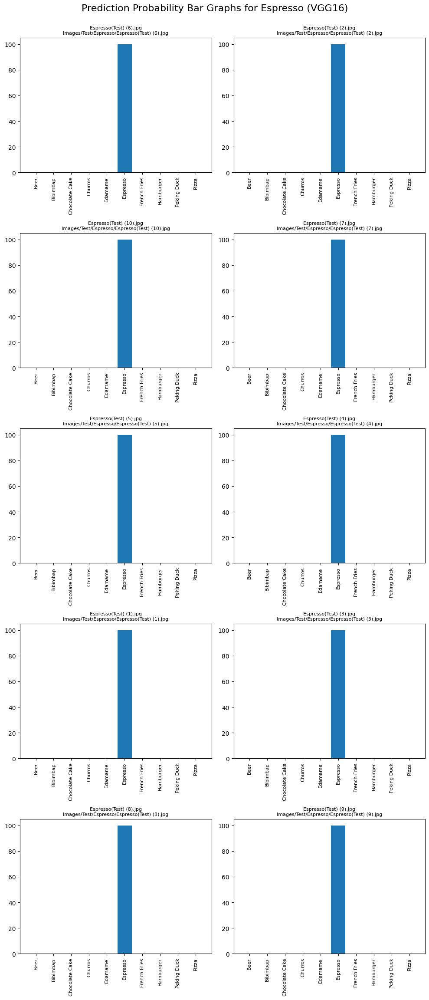

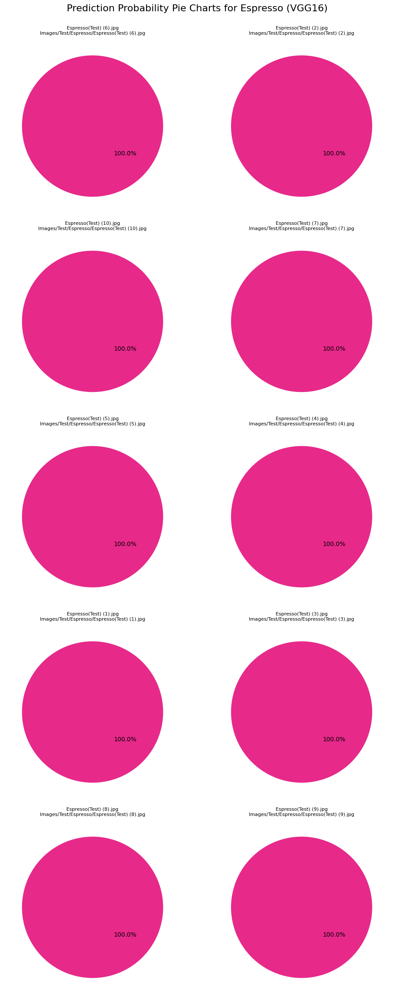

In [ ]:
# Generate and Display Predictions for a Test Dataset
model_name = "VGG16"
test_class = "Espresso"
test_images = predict_images('Images/Test/Espresso', model_vgg16,(150,150))
plot_image_collage(test_images, test_class, model_name)
plot_prediction_bars(test_images, test_class, model_name)
plot_prediction_piecharts(test_images, test_class, model_name)

## Evaluation of Test Scores

In [ ]:
# Evaluate CNN Model on Test Data
test_loss, test_accuracy = model_CNN.evaluate(test_generator)
print(f"📌 CNN Test Loss    : {test_loss:.4f}")
print(f"📌 CNN Test Accuracy: {test_accuracy:.4f}\n")

# Evaluate VGG16 Model on Test Data
test_loss, test_accuracy = model_vgg16.evaluate(test_generator)
print(f"📌 VGG16 Test Loss    : {test_loss:.4f}")
print(f"📌 VGG16 Test Accuracy: {test_accuracy:.4f}\n")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.5149 - loss: 1.4477
📌 CNN Test Loss    : 1.6062
📌 CNN Test Accuracy: 0.4200

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 880ms/step - accuracy: 0.7597 - loss: 0.7833
📌 VGG16 Test Loss    : 0.8654
📌 VGG16 Test Accuracy: 0.7300



## Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix

# Function to generate and visualize confusion matrices
def generate_confusion_matrices(test_data_path, categories, classifier, model_title):
    predicted_labels = []  # Store model predictions
    actual_labels = []  # Store actual class labels

    # Ensure IMAGE_SIZE is a tuple of two integers (width, height)
    image_size = (150, 150)

    # Iterate over each class folder and make predictions
    for label_index, category in enumerate(categories):
        category_path = os.path.join(test_data_path, category)
        for file_name in os.listdir(category_path):
            file_path = os.path.join(category_path, file_name)

            # Load and preprocess image
            image = load_img(file_path, target_size=image_size)
            image_array = img_to_array(image) * (1./255)  # Normalize pixel values
            image_array = np.expand_dims(image_array, axis=0)  # Expand dimensions for model input

            # Get model prediction
            output = classifier.predict(image_array)[0]
            predicted_label_index = np.argmax(output)

            predicted_labels.append(predicted_label_index)
            actual_labels.append(label_index)

    # Compute confusion matrices
    confusion_matrix_raw = confusion_matrix(actual_labels, predicted_labels)  # Raw count matrix
    confusion_matrix_percent = confusion_matrix_raw.astype('float') / confusion_matrix_raw.sum(axis=1)[:, np.newaxis]  # Normalize by row total

    # Plot Confusion Matrix - Percentage
    plt.figure(figsize=(8,6))
    color_map = plt.cm.Greens  # Use green colormap for clarity
    percentage_matrix = 100 * confusion_matrix_percent  # Convert to percentages
    percentage_labels = [['{0:.1f}%'.format(value) for value in row] for row in percentage_matrix]
    sb.heatmap(percentage_matrix, annot=percentage_labels, fmt='', cmap=color_map,
                xticklabels=categories, yticklabels=categories)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label (Reference)')
    plt.title(f'Confusion Matrix of {model_title} model (Percentages)')
    plt.show()

    # Plot Confusion Matrix - Raw Counts
    plt.figure(figsize=(8,6))
    color_map = plt.cm.Blues  # Use blue colormap for contrast
    sb.heatmap(confusion_matrix_raw, annot=True, fmt='d', cmap=color_map,
                xticklabels=categories, yticklabels=categories)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label (Reference)')
    plt.title(f'Confusion Matrix of {model_title} model (Raw Counts)')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

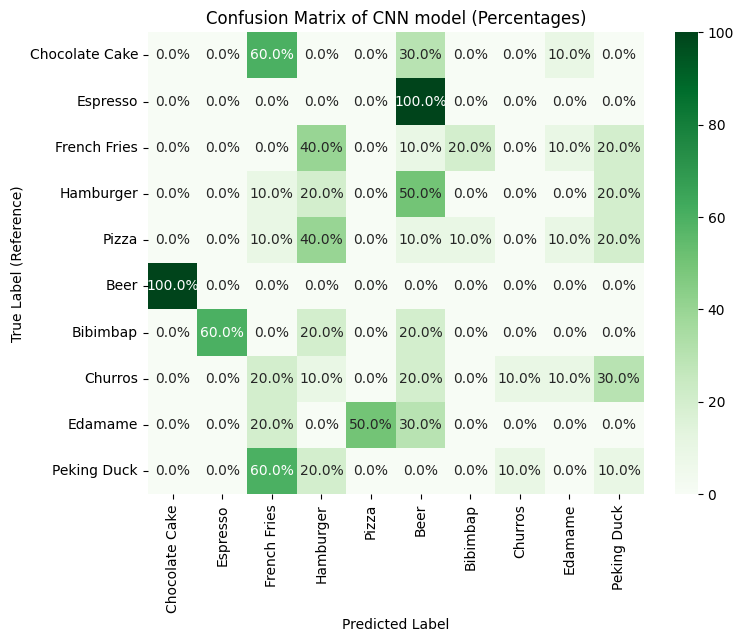

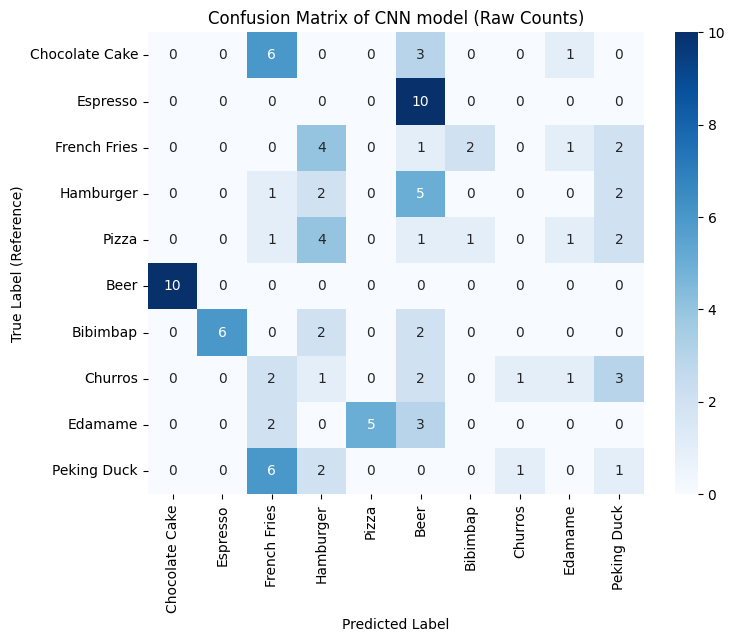

In [ ]:
# Generate confusion matrix for CNN model
test_data_path = "Images/Test"
category_labels = ['Chocolate Cake', 'Espresso', 'French Fries', 'Hamburger', 'Pizza', 'Beer', 'Bibimbap', 'Churros', 'Edamame', 'Peking Duck']
model_title = "CNN"
classifier = model_CNN
generate_confusion_matrices(test_data_path, category_labels, classifier, model_title)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

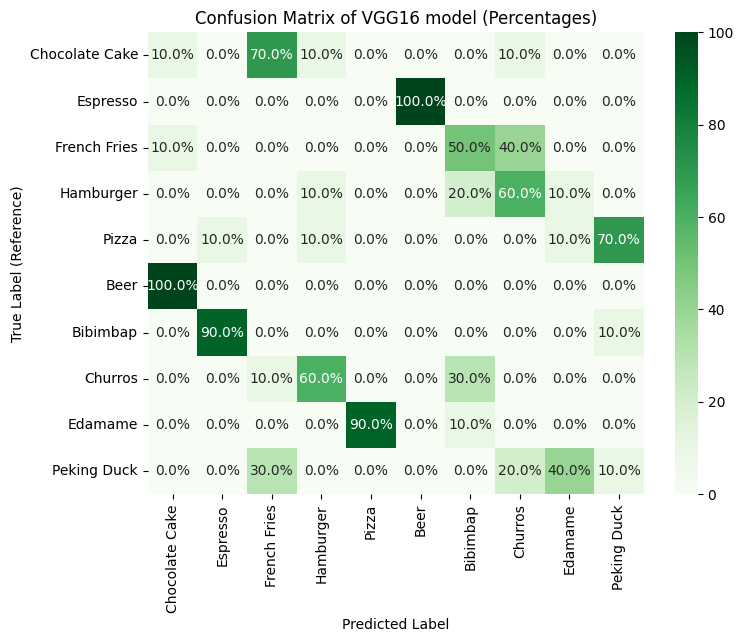

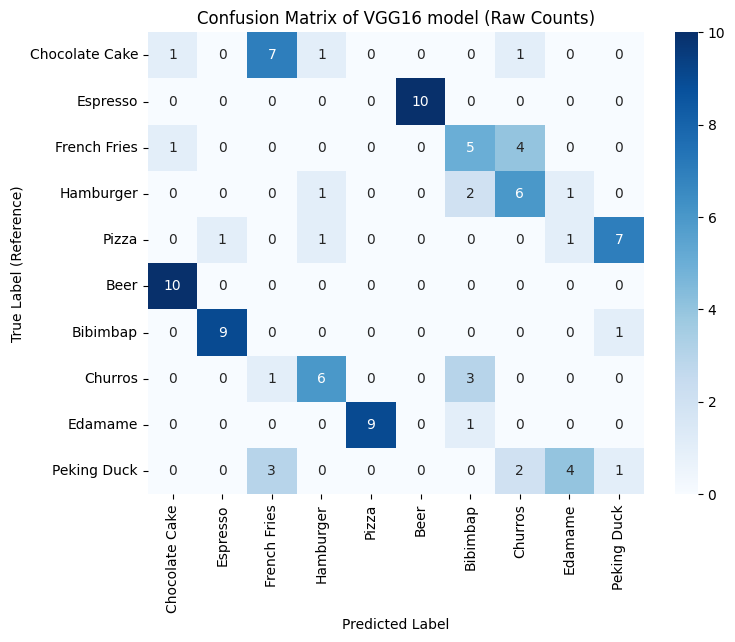

In [ ]:
# Generate confusion matrix for VGG16 model
model_title = "VGG16"
classifier = model_vgg16
generate_confusion_matrices(test_data_path, category_labels, classifier, model_title)